In [1]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
%matplotlib inline

In [2]:
workdir='/home/likkhian/chemdown9km/'
# d01=xr.open_dataset(workdir+'/hires/wrfpost_run_07_ffbb_d01.nc')
# d01ff=xr.open_dataset(workdir+'/hires/wrfpost_run_08_ff_d01.nc')
# d02=xr.open_dataset(workdir+'/hires/wrfpost_run_01_ffbb_d01.nc')
# d01cut=d01.loc[dict(lat=slice(d02.lat[0],d02.lat[-1]),lon=slice(d02.lon[0],d02.lon[-1]))]
# print(d01.var)
# ffbbw=xr.open_dataset(workdir+'JJA/wrfpost_wrfout_ffbb_d01.nc')
# ffw=xr.open_dataset(workdir+'JJA/wrfpost_wrfout_ff_d01.nc')
# bbw=xr.open_dataset(workdir+'JJA/wrfpost_wrfout_bb_d01.nc')
# ffbbd=xr.open_dataset(workdir+'JFM/wrfpost_wrfout_ffbb_d01.nc')
# ffd=xr.open_dataset(workdir+'JFM/wrfpost_wrfout_ff_d01.nc')
# bbd=xr.open_dataset(workdir+'JFM/wrfpost_wrfout_bb_d01.nc')
ffbbw=xr.open_dataset(workdir+'/wrfpost_ffbb_9km.nc')
ffw=xr.open_dataset(workdir+'/wrfpost_ff_9km.nc')
print(np.shape(ffbbw.PPT))

(92, 170, 174)


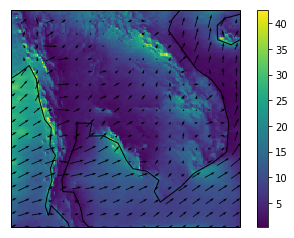

<xarray.DataArray 'lon' (lon: 174)>
array([  96.035843,   96.116798,   96.197746,   96.278702,   96.35965 ,
         96.440605,   96.521553,   96.602509,   96.683456,   96.764412,
         96.84536 ,   96.926315,   97.007263,   97.088219,   97.169167,
         97.250122,   97.33107 ,   97.412025,   97.492973,   97.573929,
         97.654877,   97.735832,   97.81678 ,   97.897736,   97.978683,
         98.059639,   98.140587,   98.221542,   98.30249 ,   98.383446,
         98.464394,   98.545349,   98.626297,   98.707253,   98.7882  ,
         98.869156,   98.950104,   99.031059,   99.112007,   99.192963,
         99.273911,   99.354866,   99.435814,   99.516769,   99.597717,
         99.678665,   99.759621,   99.840576,   99.921524,  100.002472,
        100.083427,  100.164375,  100.245331,  100.326279,  100.407234,
        100.488182,  100.569138,  100.650085,  100.731041,  100.811989,
        100.892944,  100.973892,  101.054848,  101.135796,  101.216751,
        101.297699,  101.378

In [3]:
# fig = plt.figure(1)
# plt.subplot(projection=ccrs.PlateCarree())
# plt.pcolor(ffbbw.lon.data,ffbbw.lat.data,np.mean(ffbbw.PPT,0),vmax=30,vmin=0)
# plt.colorbar()
# plt.title('JJA ffbb mean ppt')
# ax=plt.gca()
# ax.coastlines()

# plt.figure(2)
# plt.subplot(projection=ccrs.PlateCarree())
# plt.pcolor(ffw.lon.data,ffw.lat.data,np.mean(ffw.PPT,0),vmax=30,vmin=0)
# plt.colorbar()
# plt.title('JJA ff mean ppt')
# ax=plt.gca()
# ax.coastlines()

uwind=np.mean(ffbbw.U10[:,::10,::10],axis=0)
vwind=np.mean(ffbbw.V10[:,::10,::10],axis=0)
slon = ffbbw.lon[0::10]
slat = ffbbw.lat[0::10]
windspeed = (uwind**2+vwind**2)**0.5
plt.figure(3)
ax=plt.axes(projection=ccrs.PlateCarree())
ax.coastlines()
plt.pcolor(ffbbw.lon.data,ffbbw.lat.data,np.mean(ffbbw.PPT,axis=0))
plt.colorbar()
plt.quiver(slon,slat,uwind,vwind,pivot='middle')
plt.show()

print(ffbbw.lon)


/home/likkhian/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


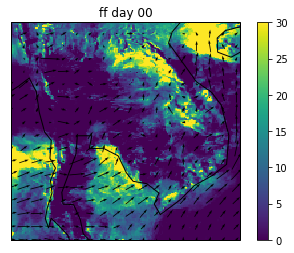

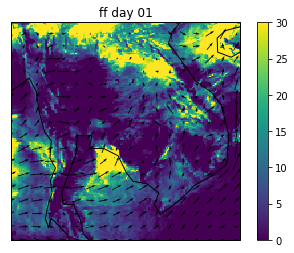

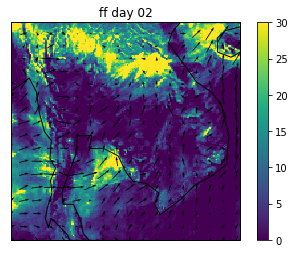

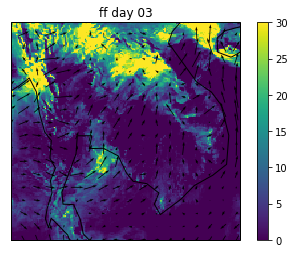

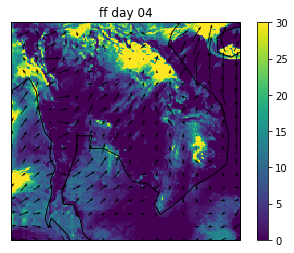

...

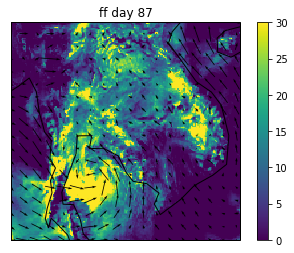

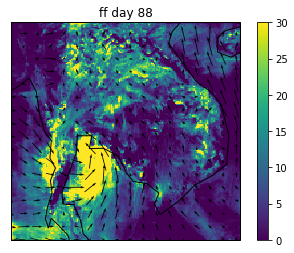

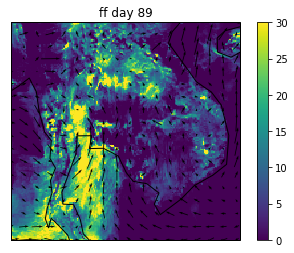

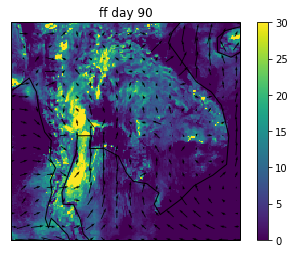

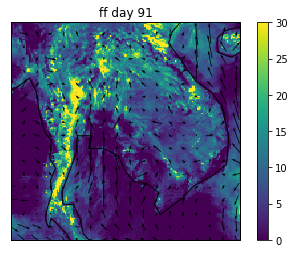

In [4]:

def windrainmovie(t):
    uwind=ffw.U10[t,::10,::10]
    vwind=ffw.V10[t,::10,::10]
    slon = ffw.lon[0::10]
    slat = ffw.lat[0::10]
    windspeed = (uwind**2+vwind**2)**0.5
    plt.figure()
    ax=plt.axes(projection=ccrs.PlateCarree())
    ax.coastlines()
    plt.pcolor(ffw.lon.data,ffw.lat.data,ffw.PPT[t,:,:],vmax=30,vmin=0)
    plt.colorbar()
    plt.quiver(slon,slat,uwind,vwind,pivot='middle')
    plt.title('ff day {:02d}'.format(t))
    plt.savefig('{:02d}.png'.format(t))

for t in range(0,92):
    windrainmovie(t)

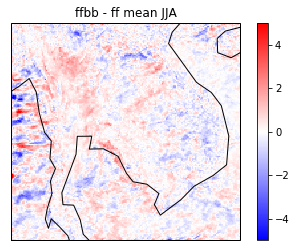

In [5]:
#plot ppt deviation
plt.figure(1)
plt.subplot(projection=ccrs.PlateCarree())
plt.pcolor(ffbbw.lon.data,ffbbw.lat.data,np.mean(ffbbw.PPT-ffw.PPT,0),cmap='bwr',vmax=5,vmin=-5)
plt.colorbar()
plt.title('ffbb - ff mean JJA')
ax=plt.gca()
ax.coastlines()

# plt.figure(2)
# plt.subplot(projection=ccrs.PlateCarree())
# plt.pcolor(ffbbw.lon.data,ffbbw.lat.data,np.mean(ffbbw.PPT-bbw.PPT,0),cmap='bwr',vmax=5,vmin=-5)
# plt.colorbar()
# plt.title('ffbb - bb mean JJA')
# ax=plt.gca()
# ax.coastlines()

# plt.figure(3)
# plt.subplot(projection=ccrs.PlateCarree())
# plt.pcolor(ffw.lon.data,ffw.lat.data,np.mean(ffw.PPT - bbw.PPT,0),cmap='bwr',vmax=5,vmin=-5)
# plt.colorbar()
# plt.title('ff - bb mean JJA')
# ax=plt.gca()
# ax.coastlines()

# plt.figure(4)
# plt.subplot(projection=ccrs.PlateCarree())
# plt.pcolor(ffbbd.lon.data,ffbbd.lat.data,np.mean(ffbbd.PPT-ffd.PPT,0),cmap='bwr',vmax=5,vmin=-5)
# plt.colorbar()
# plt.title('ffbb - ff mean JFM')
# ax=plt.gca()
# ax.coastlines()

# plt.figure(5)
# plt.subplot(projection=ccrs.PlateCarree())
# plt.pcolor(ffbbd.lon.data,ffbbd.lat.data,np.mean(ffbbd.PPT-bbd.PPT,0),cmap='bwr',vmax=5,vmin=-5)
# plt.colorbar()
# plt.title('ffbb - bb mean JFM')
# ax=plt.gca()
# ax.coastlines()

# plt.figure(6)
# plt.subplot(projection=ccrs.PlateCarree())
# plt.pcolor(ffd.lon.data,ffd.lat.data,np.mean(ffd.PPT - bbd.PPT,0),cmap='bwr',vmax=5,vmin=-5)
# plt.colorbar()
# plt.title('ff - bb mean JFM')
# ax=plt.gca()
# ax.coastlines()



In [6]:
#calculate mean difference in rainfall
print('mean rainfall difference over all JJA')
print('ffbb-ff (impact of biomass) = {:.4f}mm/d, {:.2f}%'.format(np.mean(np.array(ffbbw.PPT-ffw.PPT)),\
                                                               np.mean(np.array(ffbbw.PPT-ffw.PPT))/np.mean(np.array(ffbbw.PPT))*100))
# print('ffbb-bb (impact of fossilfuel) = {:.4f}mm/d, {:.2f}%'.format(np.mean(np.array(ffbbw.PPT-bbw.PPT)),\
#                                                                 np.mean(np.array(ffbbw.PPT-bbw.PPT))/np.mean(np.array(ffbbw.PPT))*100))
# print('ff-bb (relative impact) = {:.4f}mm/d, {:.2f}%'.format(np.mean(np.array(ffw.PPT-bbw.PPT)),\
#                                                             np.mean(np.array(ffw.PPT-bbw.PPT))/np.mean(np.array(ffw.PPT))*100))
print('mean rainfall difference over land JJA')
print('ffbb-ff (impact of biomass) = {:.4f}mm/d, {:.2f}%'.format(np.mean(np.array((ffbbw.PPT-ffw.PPT)*ffbbw.LANDMASK)),\
                                                                np.mean(np.array((ffbbw.PPT-ffw.PPT)*ffbbw.LANDMASK))/np.mean(np.array((ffbbw.PPT)*ffbbw.LANDMASK))*100))
# print('ffbb-bb (impact of fossilfuel) = {:.4f}mm/d, {:.2f}%'.format(np.mean(np.array((ffbbw.PPT-bbw.PPT)*ffbbw.LANDMASK)),\
#                                                                    np.mean(np.array((ffbbw.PPT-bbw.PPT)*ffbbw.LANDMASK))/np.mean(np.array((ffbbw.PPT)*ffbbw.LANDMASK))*100))
# print('ff-bb (relative impact) = {:.4f}mm/d, {:.2f}%'.format(np.mean(np.array((ffw.PPT-bbw.PPT)*ffbbw.LANDMASK)),\
#                                                             np.mean(np.array((ffw.PPT-bbw.PPT)*ffbbw.LANDMASK))/np.mean(np.array((ffw.PPT)*ffbbw.LANDMASK))*100))


# print('\nmean rainfall difference over all JFM')
# print('ffbb-ff (impact of biomass) = {:.4f}mm/d, {:.2f}%'.format(np.mean(np.array(ffbbd.PPT-ffd.PPT)),np.mean(np.array(ffbbd.PPT-ffd.PPT))/np.mean(np.array(ffbbd.PPT))*100))
# print('ffbb-bb (impact of fossilfuel) = {:.4f}mm/d, {:.2f}%'.format(np.mean(np.array(ffbbd.PPT-bbd.PPT)),np.mean(np.array(ffbbd.PPT-bbd.PPT))/np.mean(np.array(ffbbd.PPT))*100))
# print('ff-bb (relative impact) = {:.4f}mm/d, {:.2f}%'.format(np.mean(np.array(ffd.PPT-bbd.PPT)),np.mean(np.array(ffd.PPT-bbd.PPT))/np.mean(np.array(ffd.PPT))*100))
# print('mean rainfall difference over land JFM')
# print('ffbb-ff (impact of biomass) = {:.4f}mm/d, {:.2f}%'.format(np.mean(np.array((ffbbd.PPT-ffd.PPT)*ffbbd.LANDMASK)),np.mean(np.array((ffbbd.PPT-ffd.PPT)*ffbbd.LANDMASK))/np.mean(np.array((ffbbd.PPT)*ffbbd.LANDMASK))*100))
# print('ffbb-bb (impact of fossilfuel) = {:.4f}mm/d, {:.2f}%'.format(np.mean(np.array((ffbbd.PPT-bbd.PPT)*ffbbd.LANDMASK)),np.mean(np.array((ffbbd.PPT-bbd.PPT)*ffbbd.LANDMASK))/np.mean(np.array((ffbbd.PPT)*ffbbd.LANDMASK))*100))
# print('ff-bb (relative impact) = {:.4f}mm/d, {:.2f}%'.format(np.mean(np.array((ffd.PPT-bbd.PPT)*ffbbd.LANDMASK)),np.mean(np.array((ffd.PPT-bbd.PPT)*ffbbd.LANDMASK))/np.mean(np.array((ffd.PPT)*ffbbd.LANDMASK))*100))

# print('\nmean rainfall over land JFM')
# print('ffbb = {:.4f}mm/day'.format(np.mean(np.array(ffbbd.PPT*ffbbd.LANDMASK))))
# print('ff = {:.4f}mm/day'.format(np.mean(np.array(ffd.PPT*ffbbd.LANDMASK))))
# print('bb = {:.4f}mm/day'.format(np.mean(np.array(bbd.PPT*ffbbd.LANDMASK))))
print('\nmean rainfall over land JJA')
print('ffbb = {:.4f}mm/day'.format(np.mean(np.array(ffbbw.PPT*ffbbw.LANDMASK))))
print('ff = {:.4f}mm/day'.format(np.mean(np.array(ffw.PPT*ffbbw.LANDMASK))))
# print('bb = {:.4f}mm/day'.format(np.mean(np.array(bbw.PPT*ffbbw.LANDMASK))))

mean rainfall difference over all JJA
ffbb-ff (impact of biomass) = 0.0743mm/d, 0.78%
mean rainfall difference over land JJA
ffbb-ff (impact of biomass) = 0.0627mm/d, 1.34%

mean rainfall over land JJA
ffbb = 4.6841mm/day
ff = 4.6214mm/day


(0.95971614600670896, 2.0924459186412569e-51)


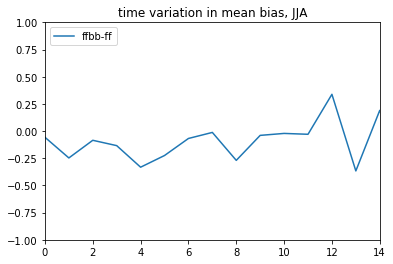

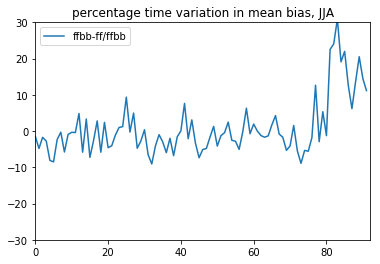

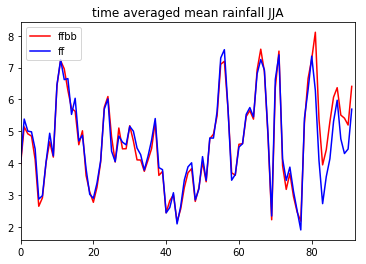

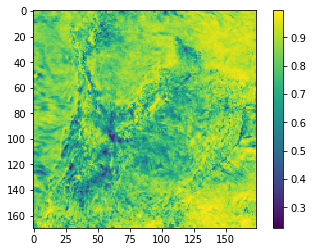

In [10]:
#plot temporal distributions in rainfall over land
time_ffbbw = np.mean(np.mean(np.array((ffbbw.PPT)*ffbbw.LANDMASK),axis=1),axis=1)
time_ffw = np.mean(np.mean(np.array((ffw.PPT)*ffbbw.LANDMASK),axis=1),axis=1)
# time_bbw = np.mean(np.mean(np.array((bbw.PPT)*ffbbw.LANDMASK),axis=1),axis=1)
# time_ffbbd = np.mean(np.mean(np.array((ffbbd.PPT)*ffbbd.LANDMASK),axis=1),axis=1)
# time_ffd = np.mean(np.mean(np.array((ffd.PPT)*ffbbd.LANDMASK),axis=1),axis=1)
# time_bbd = np.mean(np.mean(np.array((bbd.PPT)*ffbbd.LANDMASK),axis=1),axis=1)

plt.figure(1)
plt.plot(np.arange(0,92),time_ffbbw-time_ffw[:92],label='ffbb-ff')
# plt.plot(np.arange(0,92),time_ffbbw-time_bbw,label='ffbb-bb')
# plt.plot(np.arange(0,92),time_ffw-time_bbw,label='ff-bb')
plt.legend(loc='upper left')
plt.title('time variation in mean bias, JJA')
plt.xlim(0,14)
plt.ylim(-1,1)

plt.figure(2)
plt.plot(np.arange(0,92),(time_ffbbw-time_ffw[:92])/time_ffbbw*100,label='ffbb-ff/ffbb')
# plt.plot(np.arange(0,92),(time_ffbbw-time_bbw)/time_ffbbw*100,label='ffbb-bb/ffbb')
# plt.plot(np.arange(0,92),(time_ffw-time_bbw)/time_ffw*100,label='ff-bb/ff')
plt.legend(loc='upper left')
plt.title('percentage time variation in mean bias, JJA')
plt.xlim(0,92)
plt.ylim(-30,30)

# plt.figure(3)
# plt.plot(np.arange(0,91),time_ffbbd-time_ffd,label='ffbb-ff')
# plt.plot(np.arange(0,91),time_ffbbd-time_bbd,label='ffbb-bb')
# plt.plot(np.arange(0,91),time_ffd-time_bbd,label='ff-bb')
# plt.legend(loc='upper left')
# plt.title('time variation in mean bias, JFM')
# plt.xlim(0,100)
# plt.ylim(-1,1)

# plt.figure(4)
# plt.plot(np.arange(0,91),(time_ffbbd-time_ffd)/time_ffbbd*100,label='ffbb-ff/ffbb')
# plt.plot(np.arange(0,91),(time_ffbbd-time_bbd)/time_ffbbd*100,label='ffbb-bb/ffbb')
# plt.plot(np.arange(0,91),(time_ffd-time_bbd)/time_ffd*100,label='ff-bb/ff')
# plt.legend(loc='upper left')
# plt.title('percentage time variation in mean bias, JFM')
# plt.xlim(0,100)



plt.figure(5)
plt.plot(np.arange(0,92),time_ffbbw,'r',label='ffbb')
plt.plot(np.arange(0,92),time_ffw[:92],'b',label='ff')
# plt.plot(np.arange(0,92),time_bbw,'g',label='bb')
plt.legend(loc='upper left')
plt.title('time averaged mean rainfall JJA')
plt.xlim(0,92)

# plt.figure(6)
# plt.plot(np.arange(0,91),time_ffbbd,'r',label='ffbb')
# plt.plot(np.arange(0,91),time_ffd,'b',label='ff')
# plt.plot(np.arange(0,91),time_bbd,'g',label='bb')
# plt.legend(loc='upper left')
# plt.title('time averaged mean rainfall JFM')
# plt.xlim(0,100)

from scipy.stats.stats import pearsonr 
nt,nx,ny = np.shape(ffbbw.PPT)
corrmat = np.empty([nx,ny])
for i in range(0,nx):
    for j in range(0,ny):
        corrmat[i,j],w = pearsonr(ffbbw.PPT[:,i,j],ffw.PPT[:,i,j])
plt.figure(6)
plt.imshow(corrmat)
plt.colorbar()
print(pearsonr(np.mean(np.mean(np.array((ffbbw.PPT)*ffbbw.LANDMASK),axis=1),axis=1),np.mean(np.mean(np.array((ffw.PPT)*ffw.LANDMASK),axis=1),axis=1)))

In [68]:
pm25_ffbbw=np.mean(np.array(ffbbw.PM2_5_DRY*ffbbw.z))
pm25_ffw=np.mean(np.array(ffw.PM2_5_DRY*ffw.z))
pm25_bbw=np.mean(np.array(bbw.PM2_5_DRY*bbw.z))
print('JJA pm2.5 average concentration (mg/m^2)\nffbb: {:.2f}, ff: {:.2f}, bb: {:.2f}'.format(pm25_ffbbw,pm25_ffw,pm25_bbw))

pm25_ffbbd=np.mean(np.array(ffbbd.PM2_5_DRY*ffbbd.z))
pm25_ffd=np.mean(np.array(ffd.PM2_5_DRY*ffd.z))
pm25_bbd=np.mean(np.array(bbd.PM2_5_DRY*bbd.z))
print('JFM pm2.5 average concentration (mg/m^2)\nffbb: {:.2f}, ff: {:.2f}, bb: {:.2f}'.format(pm25_ffbbd,pm25_ffd,pm25_bbd))

time_pm25_ffbbw=np.mean(np.mean(np.mean(np.array(ffbbw.PM2_5_DRY*ffbbw.z),axis=1),axis=1),axis=1)
time_pm25_ffw=np.mean(np.mean(np.mean(np.array(ffw.PM2_5_DRY*ffw.z),axis=1),axis=1),axis=1)
time_pm25_bbw=np.mean(np.mean(np.mean(np.array(bbw.PM2_5_DRY*bbw.z),axis=1),axis=1),axis=1)
time_pm25_ffbbd=np.mean(np.mean(np.mean(np.array(ffbbd.PM2_5_DRY*ffbbd.z),axis=1),axis=1),axis=1)
time_pm25_ffd=np.mean(np.mean(np.mean(np.array(ffd.PM2_5_DRY*ffd.z),axis=1),axis=1),axis=1)
time_pm25_bbd=np.mean(np.mean(np.mean(np.array(bbd.PM2_5_DRY*bbd.z),axis=1),axis=1),axis=1)


JJA pm2.5 average concentration (mg/m^2)
ffbb: 605.36, ff: 374.16, bb: 623.91
JFM pm2.5 average concentration (mg/m^2)
ffbb: 6607.91, ff: 561.87, bb: 6552.08


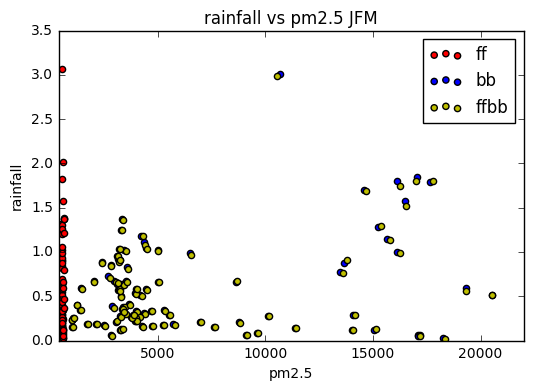

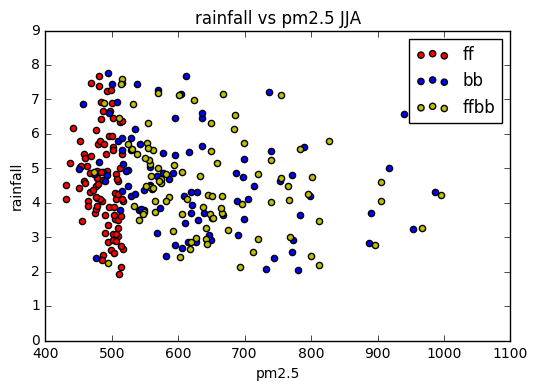

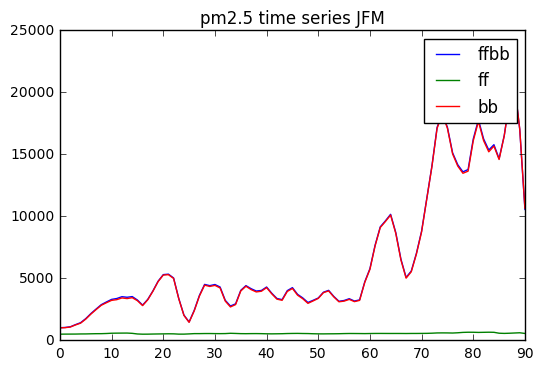

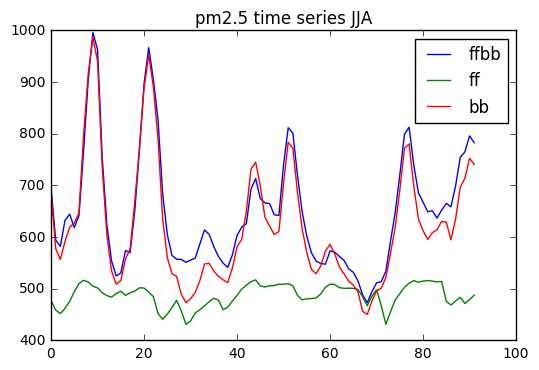

In [8]:
plt.figure(1)
ax=plt.subplot(111)
ax.scatter(time_pm25_ffd,time_ffd,c='r',label='ff')
ax.scatter(time_pm25_bbd,time_bbd,c='b',label='bb')
ax.scatter(time_pm25_ffbbd,time_ffbbd,c='y',label='ffbb')
plt.legend()
plt.ylabel('rainfall')
plt.xlabel('pm2.5')
plt.xlim(400,22000)
plt.ylim(0,3.5)
plt.title('rainfall vs pm2.5 JFM')

plt.figure(2)
ax1=plt.subplot(111)
ax1.scatter(time_pm25_ffw,time_ffw,c='r',label='ff')
ax1.scatter(time_pm25_bbw,time_bbw,c='b',label='bb')
ax1.scatter(time_pm25_ffbbw,time_ffbbw,c='y',label='ffbb')
plt.legend()
plt.ylabel('rainfall')
plt.xlabel('pm2.5')
plt.xlim(400,1100)
plt.ylim(0,9)
plt.title('rainfall vs pm2.5 JJA')

plt.figure(3)
ax3=plt.subplot(111)
ax3.plot(time_pm25_ffbbd,label='ffbb')
ax3.plot(time_pm25_ffd,label='ff')
ax3.plot(time_pm25_bbd,label='bb')
plt.legend()
plt.title('pm2.5 time series JFM')

plt.figure(4)
ax3=plt.subplot(111)
ax3.plot(time_pm25_ffbbw,label='ffbb')
ax3.plot(time_pm25_ffw,label='ff')
ax3.plot(time_pm25_bbw,label='bb')
plt.legend()
plt.title('pm2.5 time series JJA')

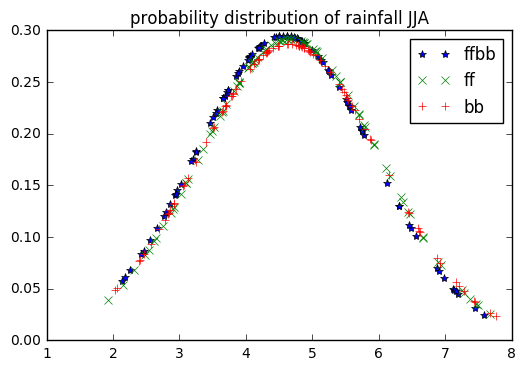

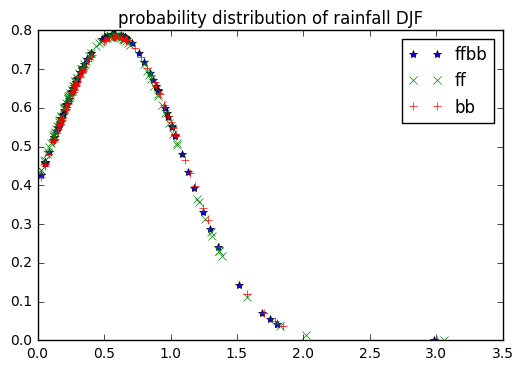

(170, 174) 7
0.01154604842 0.914429974599 
 0.00394604312993 0.949980735165


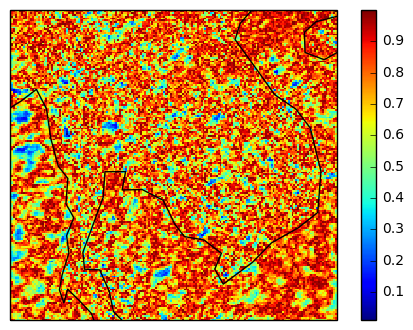

In [9]:
import scipy.stats as stats
plt.figure(1)
plt.title('probability distribution of rainfall JJA')
fit_ffbbw = stats.norm.pdf(time_ffbbw, np.mean(time_ffbbw), np.std(time_ffbbw))  
plt.plot(time_ffbbw,fit_ffbbw,'*',label='ffbb')
fit_ffw = stats.norm.pdf(time_ffw, np.mean(time_ffw), np.std(time_ffw))  
plt.plot(time_ffw,fit_ffw,'x',label='ff')
fit_bbw = stats.norm.pdf(time_bbw, np.mean(time_bbw), np.std(time_bbw))  
plt.plot(time_bbw,fit_bbw,'+',label='bb')
plt.legend()
# plt.hist(time_bbw,normed=True)      
plt.show()                   

plt.figure(2)
plt.title('probability distribution of rainfall DJF')
fit_ffbbd = stats.norm.pdf(time_ffbbd, np.mean(time_ffbbd), np.std(time_ffbbd))  
plt.plot(time_ffbbd,fit_ffbbd,'*',label='ffbb')
fit_ffd = stats.norm.pdf(time_ffd, np.mean(time_ffd), np.std(time_ffd))  #this is a fitting indeed
plt.plot(time_ffd,fit_ffd,'x',label='ff')
fit_bbd = stats.norm.pdf(time_bbd, np.mean(time_bbd), np.std(time_bbd)) 
plt.plot(time_bbd,fit_bbd,'+',label='bb')
plt.legend()
# plt.hist(time_bbw,normed=True) 
plt.show()    

#t test
t, p = stats.ttest_ind(ffw.PPT, bbw.PPT, equal_var=False)
print(p.shape,sum(sum(p<0.1)))
plt.figure(3)
plt.subplot(projection=ccrs.PlateCarree())
plt.pcolor(ffbbw.lon,ffbbw.lat,p)
ax=plt.gca()
ax.coastlines()
plt.colorbar()

#f test for variance. Assume normal distribution (looks ok for JJA)
tv,pv = stats.bartlett(time_ffbbw,time_ffw)
tl,pl = stats.levene(time_ffbbw,time_ffw,center='mean')
print(tv,pv,'\n',tl,pl)


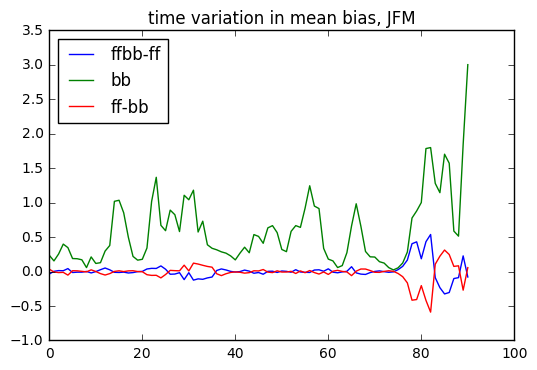

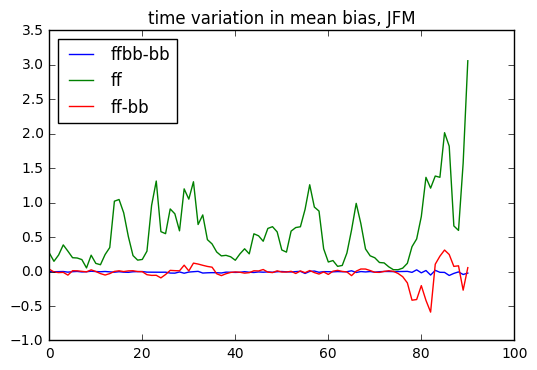

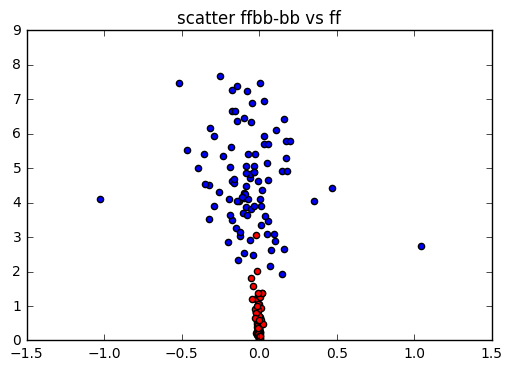

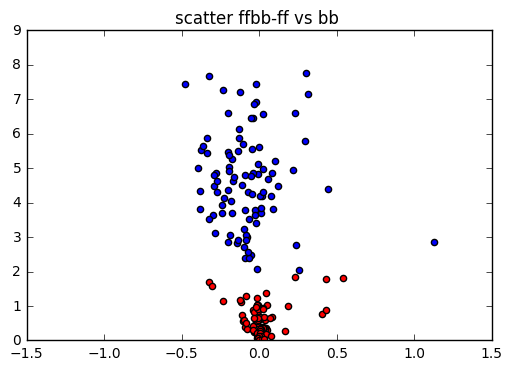

In [10]:
#20170619 Comparing ffbb-ff vs bb, ffbb-bb vs ff
import eofs
plt.figure(1)
plt.plot(np.arange(0,91),time_ffbbd-time_ffd,label='ffbb-ff')
plt.plot(np.arange(0,91),time_bbd,label='bb')
plt.plot(np.arange(0,91),time_ffd-time_bbd,label='ff-bb')
plt.legend(loc='upper left')
plt.title('time variation in mean bias, JFM')
plt.xlim(0,100)
# plt.ylim(-1,1)

plt.figure(2)
plt.plot(np.arange(0,91),time_ffbbd-time_bbd,label='ffbb-bb')
plt.plot(np.arange(0,91),time_ffd,label='ff')
plt.plot(np.arange(0,91),time_ffd-time_bbd,label='ff-bb')
plt.legend(loc='upper left')
plt.title('time variation in mean bias, JFM')
plt.xlim(0,100)

plt.figure(3)
plt.scatter(time_ffbbd-time_bbd,time_ffd,c='r')
plt.scatter(time_ffbbw-time_bbw,time_ffw,c='b')
plt.title('scatter ffbb-bb vs ff')
plt.xlim(-1.5,1.5)
plt.ylim(0,9)

plt.figure(4)
plt.scatter(time_ffbbd-time_ffd,time_bbd,c='r')
plt.scatter(time_ffbbw-time_ffw,time_bbw,c='b')
plt.title('scatter ffbb-ff vs bb ')
plt.xlim(-1.5,1.5)
plt.ylim(0,9)

lons=ffbbw.lon
lats=ffbbw.lat
time=ffbbw.time


/home/likkhian/anaconda3/lib/python3.6/site-packages/eofs/xarray.py:224: FutureWarning: Coordinate has been deprecated. Use IndexVariable instead.
  attrs={'long_name': 'eof_mode_number'})
/home/likkhian/anaconda3/lib/python3.6/site-packages/eofs/xarray.py:178: FutureWarning: Coordinate has been deprecated. Use IndexVariable instead.
  attrs={'long_name': 'eof_mode_number'})
/home/likkhian/anaconda3/lib/python3.6/site-packages/eofs/xarray.py:371: FutureWarning: Coordinate has been deprecated. Use IndexVariable instead.
  attrs={'long_name': 'eof_mode_number'})
/home/likkhian/anaconda3/lib/python3.6/site-packages/eofs/xarray.py:413: FutureWarning: Coordinate has been deprecated. Use IndexVariable instead.
  attrs={'long_name': 'eof_mode_number'})
/home/likkhian/anaconda3/lib/python3.6/site-packages/eofs/xarray.py:271: FutureWarning: Coordinate has been deprecated. Use IndexVariable instead.
  attrs={'long_name': 'eof_mode_number'})
/home/likkhian/anaconda3/lib/python3.6/site-packages/eo

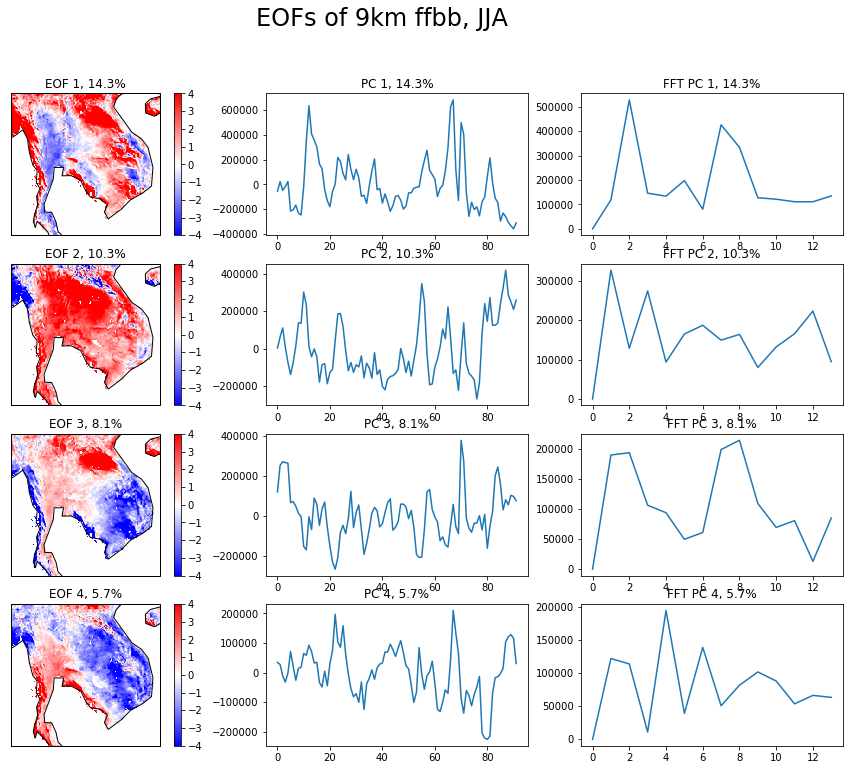

In [13]:
#eof
plt.close('all')
from eofs.xarray import Eof
ffbb_solver = Eof(ffbbw.PPT*ffbbw.LANDMASK,center=True)
ffbb_eofs = ffbb_solver.eofs(neofs=4,eofscaling=2)
ffbb_pcs = ffbb_solver.pcs(npcs=4,pcscaling=2)
ffbb_eigenvalues = ffbb_solver.eigenvalues()
ffbb_variance_fraction = ffbb_solver.varianceFraction()
ffbb_eofs_correlation = ffbb_solver.eofsAsCorrelation(neofs=4)
ffbb_eofs_covariance = ffbb_solver.eofsAsCovariance(neofs=4,pcscaling=1)

ff_solver = Eof(ffw.PPT*ffw.LANDMASK,center=True)
ff_eofs = ff_solver.eofs(neofs=4,eofscaling=2)
ff_pcs = ff_solver.pcs(npcs=4,pcscaling=2)
ff_eigenvalues = ff_solver.eigenvalues()
ff_variance_fraction = ff_solver.varianceFraction()
ff_eofs_correlation = ff_solver.eofsAsCorrelation(neofs=4)
ff_eofs_covariance = ff_solver.eofsAsCovariance(neofs=4,pcscaling=1)

# bb_solver = Eof(bbw.PPT*bbw.LANDMASK,center=True)
# bb_eofs = bb_solver.eofs(neofs=4,eofscaling=2)
# bb_pcs = bb_solver.pcs(npcs=4,pcscaling=2)
# bb_eigenvalues = bb_solver.eigenvalues()
# bb_variance_fraction = bb_solver.varianceFraction()
# bb_eofs_correlation = bb_solver.eofsAsCorrelation(neofs=4)
# bb_eofs_covariance = bb_solver.eofsAsCovariance(neofs=4,pcscaling=1)

#do the addition/subtraction here
eofs = ffbb_eofs#-ff_eofs#-ff_eofs
variance_fraction = ffbb_variance_fraction#-ff_variance_fraction#-ff_variance_fraction
pcs = ffbb_pcs#-ff_pcs#-ff_pcs

#time-series analysis
# from statsmodels.tsa.seasonal import seasonal_decompose
# result=seasonal_decompose(pcs[:,0],model='multiplicative',freq=1)
result=np.fft.fft(pcs,axis=0)
# %matplotlib qt

plt.rcParams["figure.figsize"] = 16,12 #change inline plot size
fig=plt.figure(1)
ax=fig.add_subplot(431,projection=ccrs.PlateCarree())
i=ax.pcolor(ffbbw.lon,ffbbw.lat,eofs[0,:,:],cmap='bwr',vmax=4,vmin=-4) #norm=MidPointNorm(midpoint=0))
ax.set_title('EOF 1, {:.1f}%'.format(float(variance_fraction[0].data)*100))
fig.colorbar(i)
ax.coastlines()
ax2=fig.add_subplot(434,projection=ccrs.PlateCarree())
ii=ax2.pcolor(ffbbw.lon,ffbbw.lat,eofs[1,:,:],cmap='bwr',vmax=4,vmin=-4) #norm=MidPointNorm(midpoint=0))
ax2.set_title('EOF 2, {:.1f}%'.format(float(variance_fraction[1].data)*100))
fig.colorbar(ii)
ax2.coastlines()
ax3=fig.add_subplot(437,projection=ccrs.PlateCarree())
iii=ax3.pcolor(ffbbw.lon,ffbbw.lat,eofs[2,:,:],cmap='bwr',vmax=4,vmin=-4) #norm=MidPointNorm(midpoint=0))
ax3.set_title('EOF 3, {:.1f}%'.format(float(variance_fraction[2].data)*100))
fig.colorbar(iii)
ax3.coastlines()
ax4=fig.add_subplot(4,3,10,projection=ccrs.PlateCarree())
iiii=ax4.pcolor(ffbbw.lon,ffbbw.lat,eofs[3,:,:],cmap='bwr',vmax=4,vmin=-4) #norm=MidPointNorm(midpoint=0))
ax4.set_title('EOF 4, {:.1f}%'.format(float(variance_fraction[3].data)*100))
fig.colorbar(iiii)
ax4.coastlines()

ax=fig.add_subplot(432)
i=ax.plot(pcs[:,0])
ax.set_title('PC 1, {:.1f}%'.format(float(variance_fraction[0].data)*100))
ax2=fig.add_subplot(435)
ii=ax2.plot(pcs[:,1])
ax2.set_title('PC 2, {:.1f}%'.format(float(variance_fraction[1].data)*100))
ax3=fig.add_subplot(438)
iii=ax3.plot(pcs[:,2])
ax3.set_title('PC 3, {:.1f}%'.format(float(variance_fraction[2].data)*100))
ax4=fig.add_subplot(4,3,11)
iiii=ax4.plot(pcs[:,3])
ax4.set_title('PC 4, {:.1f}%'.format(float(variance_fraction[3].data)*100))

ax=fig.add_subplot(433)
ax.set_title('FFT PC 1, {:.1f}%'.format(float(variance_fraction[0].data)*100))
i=ax.plot(2/29*np.abs(result[:29//2,0]))
ax=fig.add_subplot(436)
ax.set_title('FFT PC 2, {:.1f}%'.format(float(variance_fraction[1].data)*100))
i=ax.plot(2/29*np.abs(result[:29//2,1]))
ax=fig.add_subplot(439)
ax.set_title('FFT PC 3, {:.1f}%'.format(float(variance_fraction[2].data)*100))
i=ax.plot(2/29*np.abs(result[:29//2,2]))
ax=fig.add_subplot(4,3,12)
ax.set_title('FFT PC 4, {:.1f}%'.format(float(variance_fraction[3].data)*100))
i=ax.plot(2/29*np.abs(result[:29//2,3]))
plt.suptitle('EOFs of 9km ffbb, JJA',fontsize=24)

plt.show()
# fig=plt.figure(3)
# ax=fig.add_subplot(411,projection=ccrs.PlateCarree())
# i=ax.pcolor(ffbbw.lon,ffbbw.lat,eofs_correlation[0,:,:],cmap='bwr',vmax=1,vmin=-1) #norm=MidPointNorm(midpoint=0))
# ax.set_title('EOF as correlation 1, {:.1f}%'.format(float(variance_fraction[0].data)*100))
# fig.colorbar(i)
# ax.coastlines()
# ax2=fig.add_subplot(412,projection=ccrs.PlateCarree())
# ii=ax2.pcolor(ffbbw.lon,ffbbw.lat,eofs_correlation[1,:,:],cmap='bwr',vmax=1,vmin=-1) #norm=MidPointNorm(midpoint=0))
# ax2.set_title('EOF as correlation 2, {:.1f}%'.format(float(variance_fraction[1].data)*100))
# fig.colorbar(ii)
# ax2.coastlines()
# ax3=fig.add_subplot(413,projection=ccrs.PlateCarree())
# iii=ax3.pcolor(ffbbw.lon,ffbbw.lat,eofs_correlation[2,:,:],cmap='bwr',vmax=1,vmin=-1) #norm=MidPointNorm(midpoint=0))
# ax3.set_title('EOF as correlation 3, {:.1f}%'.format(float(variance_fraction[2].data)*100))
# fig.colorbar(iii)
# ax3.coastlines()
# ax4=fig.add_subplot(414,projection=ccrs.PlateCarree())
# iiii=ax4.pcolor(ffbbw.lon,ffbbw.lat,eofs_correlation[3,:,:],cmap='bwr',vmax=1,vmin=-1) #norm=MidPointNorm(midpoint=0))
# ax4.set_title('EOF as correlation 4, {:.1f}%'.format(float(variance_fraction[3].data)*100))
# fig.colorbar(iiii)
# ax4.coastlines()
# plt.suptitle('EOF as correlation for ffbb JJA')

# fig=plt.figure(4)
# ax=fig.add_subplot(411,projection=ccrs.PlateCarree())
# i=ax.pcolor(ffbbw.lon,ffbbw.lat,eofs_covariance[0,:,:],cmap='bwr',vmax=1,vmin=-1) #norm=MidPointNorm(midpoint=0))
# ax.set_title('EOF as covariance 1, {:.1f}%'.format(float(variance_fraction[0].data)*100))
# fig.colorbar(i)
# ax.coastlines()
# ax2=fig.add_subplot(412,projection=ccrs.PlateCarree())
# ii=ax2.pcolor(ffbbw.lon,ffbbw.lat,eofs_covariance[1,:,:],cmap='bwr',vmax=1,vmin=-1) #norm=MidPointNorm(midpoint=0))
# ax2.set_title('EOF as covariance 2, {:.1f}%'.format(float(variance_fraction[1].data)*100))
# fig.colorbar(ii)
# ax2.coastlines()
# ax3=fig.add_subplot(413,projection=ccrs.PlateCarree())
# iii=ax3.pcolor(ffbbw.lon,ffbbw.lat,eofs_covariance[2,:,:],cmap='bwr',vmax=1,vmin=-1) #norm=MidPointNorm(midpoint=0))
# ax3.set_title('EOF as covariance 3, {:.1f}%'.format(float(variance_fraction[2].data)*100))
# fig.colorbar(iii)
# ax3.coastlines()
# ax4=fig.add_subplot(414,projection=ccrs.PlateCarree())
# iiii=ax4.pcolor(ffbbw.lon,ffbbw.lat,eofs_covariance[3,:,:],cmap='bwr',vmax=1,vmin=-1) #norm=MidPointNorm(midpoint=0))
# ax4.set_title('EOF as covariance 4, {:.1f}%'.format(float(variance_fraction[3].data)*100))
# fig.colorbar(iiii)
# ax4.coastlines()
# plt.suptitle('EOF as covariance for ffbb JJA')

# plt.rcParams["figure.figsize"] = 6,4
# fig=plt.figure(5)
# ax=fig.add_subplot(111)
# ax.plot(variance_fraction)
# ax.set_title('Variance fraction distribution')
# plt.show()

3.00809465167


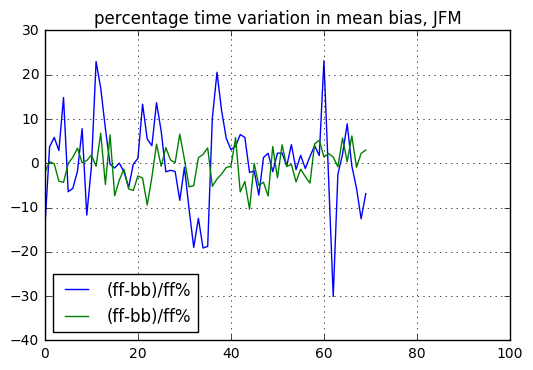

In [48]:
%matplotlib inline
plt.rcParams["figure.figsize"] = 6,4
plt.plot(np.arange(0,70),(time_bbd[:70]-time_ffd[:70])/time_bbd[:70]*100,np.arange(0,70),(time_bbw[:70]-time_ffw[:70])/time_bbw[:70]*100,label='(ff-bb)/ff%')
plt.legend(loc='lower left')
plt.title('percentage time variation in mean bias, JFM')
plt.xlim(0,100)
plt.grid('on')
print(np.mean((time_bbd-time_ffd)/time_bbd*100))

In [3]:
from matplotlib.colors import Normalize
from numpy import ma
from matplotlib import cbook
class MidPointNorm(Normalize):    
    def __init__(self, midpoint=0, vmin=None, vmax=None, clip=False):
        Normalize.__init__(self,vmin, vmax, clip)
        self.midpoint = midpoint

    def __call__(self, value, clip=None):
        if clip is None:
            clip = self.clip

        result, is_scalar = self.process_value(value)

        self.autoscale_None(result)
        vmin, vmax, midpoint = self.vmin, self.vmax, self.midpoint

        if not (vmin < midpoint < vmax):
            raise ValueError("midpoint must be between maxvalue and minvalue.")       
        elif vmin == vmax:
            result.fill(0) # Or should it be all masked? Or 0.5?
        elif vmin > vmax:
            raise ValueError("maxvalue must be bigger than minvalue")
        else:
            vmin = float(vmin)
            vmax = float(vmax)
            if clip:
                mask = ma.getmask(result)
                result = ma.array(np.clip(result.filled(vmax), vmin, vmax),
                                  mask=mask)

            # ma division is very slow; we can take a shortcut
            resdat = result.data

            #First scale to -1 to 1 range, than to from 0 to 1.
            resdat -= midpoint            
            resdat[resdat>0] /= abs(vmax - midpoint)            
            resdat[resdat<0] /= abs(vmin - midpoint)

            resdat /= 2.
            resdat += 0.5
            result = ma.array(resdat, mask=result.mask, copy=False)                

        if is_scalar:
            result = result[0]            
        return result

    def inverse(self, value):
        if not self.scaled():
            raise ValueError("Not invertible until scaled")
        vmin, vmax, midpoint = self.vmin, self.vmax, self.midpoint

        if cbook.iterable(value):
            val = ma.asarray(value)
            val = 2 * (val-0.5)  
            val[val>0]  *= abs(vmax - midpoint)
            val[val<0] *= abs(vmin - midpoint)
            val += midpoint
            return val
        else:
            val = 2 * (val - 0.5)
            if val < 0: 
                return  val*abs(vmin-midpoint) + midpoint
            else:
                return  val*abs(vmax-midpoint) + midpoint

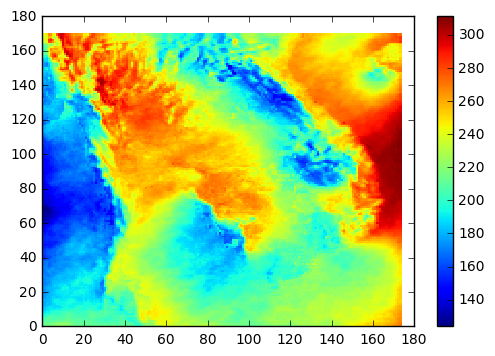

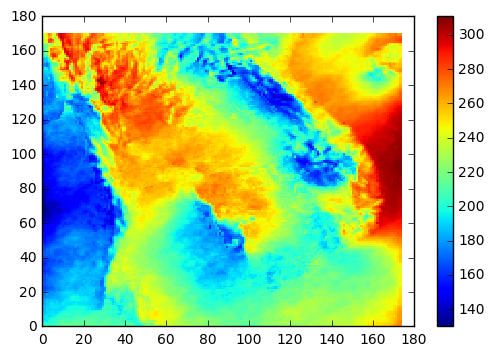

In [85]:
plt.figure(1)
plt.pcolor(np.mean(ffw.SWDOWN,0))
plt.colorbar()
plt.figure(2)
plt.pcolor(np.mean(bbw.SWDOWN,0))
plt.colorbar()

# old stuff below

In [ ]:
plt.figure(1)
plt.subplot(projection=ccrs.PlateCarree())
plt.pcolor(d02.lon.data,d02.lat.data,d02.T2[0,:,:],vmin=290,vmax=310)
plt.colorbar()
plt.title('3km domain ffbb ')
ax=plt.gca()
ax.coastlines()

plt.figure(2)
plt.subplot(projection=ccrs.PlateCarree())
plt.pcolor(d01cut.lon.data,d01cut.lat.data,d01cut.T2[0,:,:],vmin=290,vmax=310)
plt.colorbar()
plt.title('9km domain ffbb ')
ax=plt.gca()
ax.coastlines()

In [ ]:
def integrateExist(data):
    nlvl=len(data.lvl)
    nlat=len(data.lat)
    nlon=len(data.lon)
    cldframean=np.mean(data.CLDFRA,0)
    cldfraSurf=np.zeros([nlat,nlon])
    cloudsInd=(cldframean>0.001)
    clouds=cloudsInd*cldframean
    cldfraSurf=np.sum(clouds,0)/np.sum(cloudsInd,0)
    return cldfraSurf


In [ ]:
d01cldfra2d=integrateExist(d01)
d02cldfra2d=integrateExist(d02)

In [ ]:
d01ffcldfra2d=integrateExist(d01ff)

In [ ]:
print(np.shape(d02.PM10))
plt.figure(5)
plt.subplot(projection=ccrs.PlateCarree())
plt.pcolor(d02.lon.data,d02.lat.data,np.mean(np.sum(d02.PM10,1),0),vmin=0,vmax=30)
plt.colorbar()
plt.title('3km domain ffbb mean pm10')
ax=plt.gca()
ax.coastlines()

plt.figure(6)
plt.subplot(projection=ccrs.PlateCarree())
plt.pcolor(d01cut.lon.data,d01cut.lat.data,np.mean(np.sum(d01cut.PM10,1),0),vmin=0,vmax=30)
plt.colorbar()
plt.title('9km domain ffbb mean pm10')
ax=plt.gca()
ax.coastlines()

plt.figure(7)
plt.subplot(projection=ccrs.PlateCarree())
plt.pcolor(d01ff.lon.data,d01ff.lat.data,np.mean(np.sum(d01ff.PM10,1),0),vmin=0,vmax=10)
plt.colorbar()
plt.title('9km domain ff mean pm10')
ax=plt.gca()
ax.coastlines()


In [ ]:
plt.figure(8)
plt.subplot(projection=ccrs.PlateCarree())
plt.pcolor(d02.lon.data,d02.lat.data,d02cldfra2d,vmin=0,vmax=1)
plt.colorbar()
plt.title('3km domain ffbb mean cloudfra')
ax=plt.gca()
ax.coastlines()

plt.figure(9)
plt.subplot(projection=ccrs.PlateCarree())
plt.pcolor(d01.lon.data,d01.lat.data,d01cldfra2d,vmin=0,vmax=1)
plt.colorbar()
plt.title('9km domain ffbb mean cloudfra')
ax=plt.gca()
ax.coastlines()

plt.figure(10)
plt.subplot(projection=ccrs.PlateCarree())
plt.pcolor(d01ff.lon.data,d01ff.lat.data,d01ffcldfra2d,vmin=0,vmax=1)
plt.colorbar()
plt.title('9km domain ff mean cloudfra')
ax=plt.gca()
ax.coastlines()

In [ ]:
def integrateExistQ(data):
    nlvl=len(data.lvl)
    nlat=len(data.lat)
    nlon=len(data.lon)
    cldframean=np.mean(data.QCLOUD,0)
    cldfraSurf=np.zeros([nlat,nlon])
    cloudsInd=(cldframean>0.00001)
    clouds=cloudsInd*cldframean
    cldfraSurf=np.sum(clouds,0)/np.sum(cloudsInd,0)
    return cldfraSurf

In [ ]:
d01qcloud2d=integrateExistQ(d01)
d02qcloud2d=integrateExistQ(d02)

In [ ]:
d01ffqcloud2d=integrateExistQ(d01ff)

In [ ]:
plt.figure(11)
plt.subplot(projection=ccrs.PlateCarree())
plt.pcolor(d02.lon.data,d02.lat.data,d02qcloud2d)#,vmin=0,vmax=1)
plt.colorbar()
plt.title('3km domain ffbb mean qcloud')
ax=plt.gca()
ax.coastlines()

plt.figure(12)
plt.subplot(projection=ccrs.PlateCarree())
plt.pcolor(d01.lon.data,d01.lat.data,d01cldfra2d)#,vmin=0,vmax=1)
plt.colorbar()
plt.title('9km domain ffbb mean qcloud')
ax=plt.gca()
ax.coastlines()

plt.figure(13)
plt.subplot(projection=ccrs.PlateCarree())
plt.pcolor(d01ff.lon.data,d01ff.lat.data,d01ffcldfra2d)#,vmin=0,vmax=1)
plt.colorbar()
plt.title('9km domain ff mean qcloud')
ax=plt.gca()
ax.coastlines()

plt.figure(14)
plt.subplot(projection=ccrs.PlateCarree())
plt.pcolor(d02.lon.data,d02.lat.data,np.sum(np.sum(d02.QCLOUD,0),0))#,vmin=0,vmax=1)
plt.colorbar()
plt.title('3km domain ffbb sum qcloud')
ax=plt.gca()
ax.coastlines()

plt.figure(15)
plt.subplot(projection=ccrs.PlateCarree())
plt.pcolor(d01cut.lon.data,d01cut.lat.data,np.sum(np.sum(d01cut.QCLOUD,0),0))#,vmin=0,vmax=1)
plt.colorbar()
plt.title('9km domain ffbb sum qcloud')
ax=plt.gca()
ax.coastlines()

plt.figure(16)
plt.subplot(projection=ccrs.PlateCarree())
plt.pcolor(d01ff.lon.data,d01ff.lat.data,np.sum(np.sum(d01ff.QCLOUD,0),0))#,vmin=0,vmax=1)
plt.colorbar()
plt.title('9km domain ff sum qcloud')
ax=plt.gca()
ax.coastlines()

In [ ]:
totalConc=[]
for ii in d02.PM2_5_DRY:
    tot=sum(sum(sum(ii)))
    totalConc.append(tot)

In [ ]:
print(len(totalConc))
plt.plot(np.array(totalConc))
plt.xticks(np.arange(0, 92, 5))
plt.title('total pm2.5')

In [ ]:
totalConc=[]
for ii in d02.PM10:
    tot=sum(sum(sum(ii)))
    totalConc.append(tot)
print(len(totalConc))
plt.plot(np.array(totalConc))
plt.xticks(np.arange(0, 92, 5))
plt.title('total pm10')